In [1]:
pip install pillow

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 26.0 -> 26.1.1
[notice] To update, run: C:\Users\Win11\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Understand the digital Image

In [2]:
# Import all the realted libraries for Image processing
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import cv2
import numpy as np

In [4]:
# Load the image from the directory
image = Image.open('../images/baboon.png')

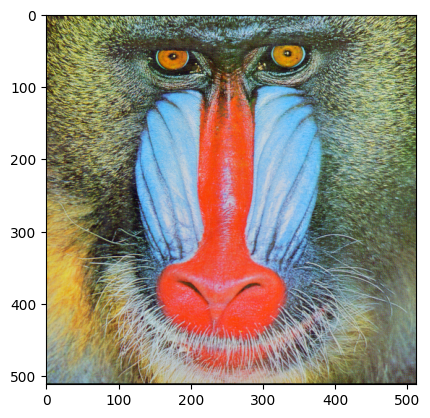

In [5]:
# Plot the image
plt.imshow(image)

In [121]:
# First, let's define a helper function to concatenate two images side-by-side. You will not need to understand the code below at this moment, but this function will be used repeatedly in this page to showcase the results.

def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

In [ ]:
# Image maetdata view
print(image.format,
image.size,
image.mode)

PNG (512, 512) RGB


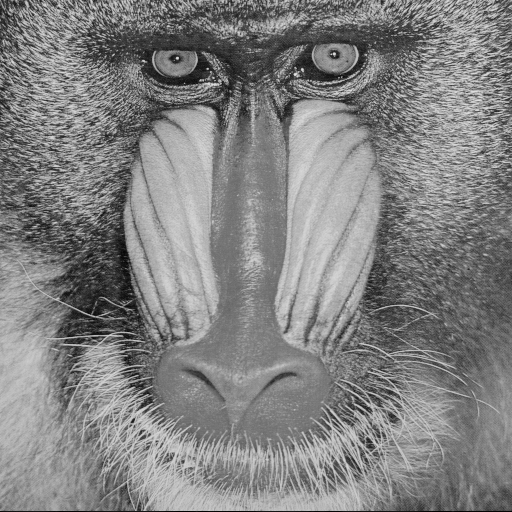

In [10]:
# Convert the image to grayscale
image_gray=ImageOps.grayscale(image)
image_gray

In [15]:
# Split the image to grayscale RGB mode
baboon=image
red,green,blue=baboon.split()

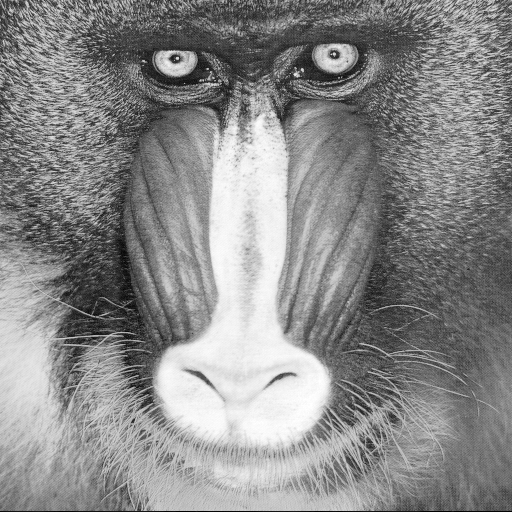

In [16]:
red

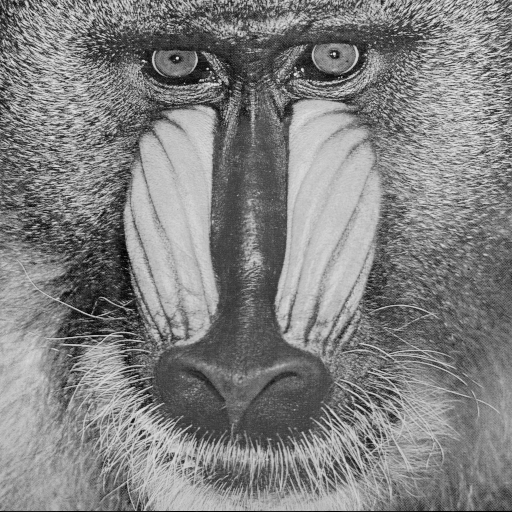

In [17]:
green

In [30]:
# Convert the PIL image to an array
array=np.array(image)

print(array.size)
print(len(array))
print(array.shape)

# print(array)

786432
512
(512, 512, 3)


Using OpenCV
- OpenCV is BGR Unlike PIL(rgb)

In [3]:
image=cv2.imread('../images/baboon.png')

In [4]:
type(image)
image.shape

(512, 512, 3)

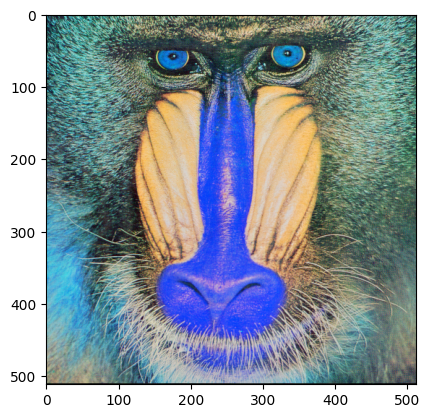

In [5]:
# The oder of the color image is BRG in cv2
plt.imshow(image)


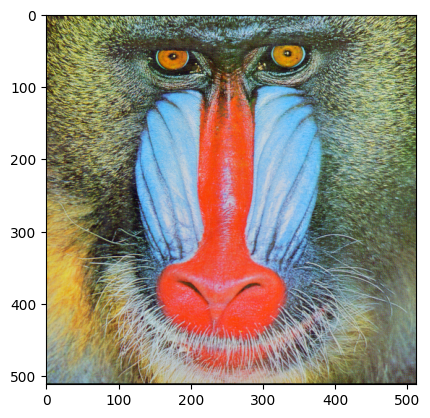

In [ ]:
# Convert the image BGR -> RGB
new_image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.imshow(new_image)

In [49]:
def get_concat_h_bgr(im1, im2):
    im1_rgb = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
    im2_rgb = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)

    dst = Image.new('RGB', (im1_rgb.shape[1] + im2_rgb.shape[1], im1_rgb.shape[0]))
    dst.paste(Image.fromarray(im1_rgb), (0, 0))
    dst.paste(Image.fromarray(im2_rgb), (im1_rgb.shape[1], 0))

    return cv2.cvtColor(np.array(dst), cv2.COLOR_RGB2BGR)

In [ ]:
# Split the BGR image to index 0,1,2
baboon=new_image
blue, green, red= baboon[:,:,0], baboon[:,:,1], baboon[:,:,2]

In [ ]:
# Display image side(blue 2D array) by side(green 2D array)
def get_concat_h(im1, im2):
    im1 = Image.fromarray(im1.astype(np.uint8), mode='L')
    im2 = Image.fromarray(im2.astype(np.uint8), mode='L')

    dst = Image.new('L', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

baboon = new_image
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]

out = get_concat_h(blue, green)
out.show()

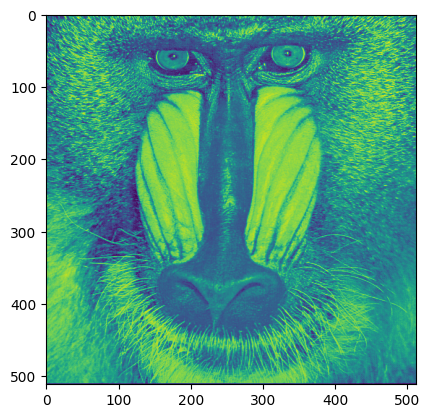

In [45]:
# Plot the BRG image
plt.imshow(blue)
plt.imshow(red)
plt.imshow(green)

In [ ]:
# Check the intensity of the image at givn cordinates
x = 0
y = 1
image[y,x]

array([ 62, 125, 120], dtype=uint8)

**Grayscale Images, Quantization and Color Channels**

The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method quantize. Let's repeatably cut the number of levels in half and observe what happens:
Half the levels do not make a noticable difference.

In [55]:
from PIL import ImageOps 

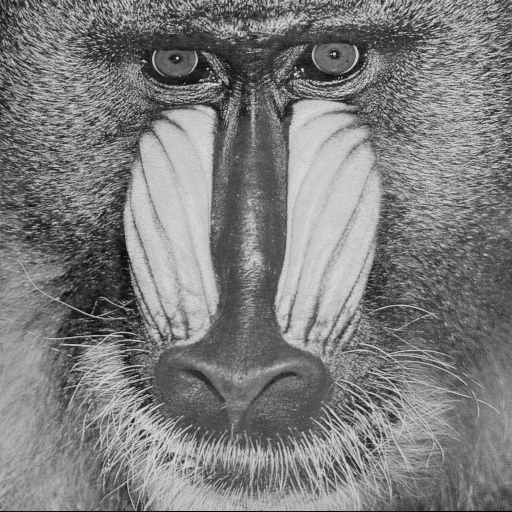

In [56]:
image_pil = Image.fromarray(image.astype('uint8'))
image_gray = ImageOps.grayscale(image_pil)
image_gray

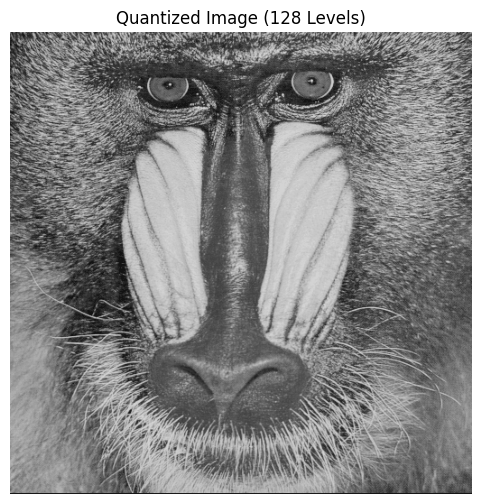

In [57]:
# Image quantisize
quantized_image = image_gray.quantize(256 // 2)

plt.figure(figsize=(6, 6))
plt.imshow(quantized_image.convert('RGB'))
plt.title("Quantized Image (128 Levels)")
plt.axis("off")
plt.show()

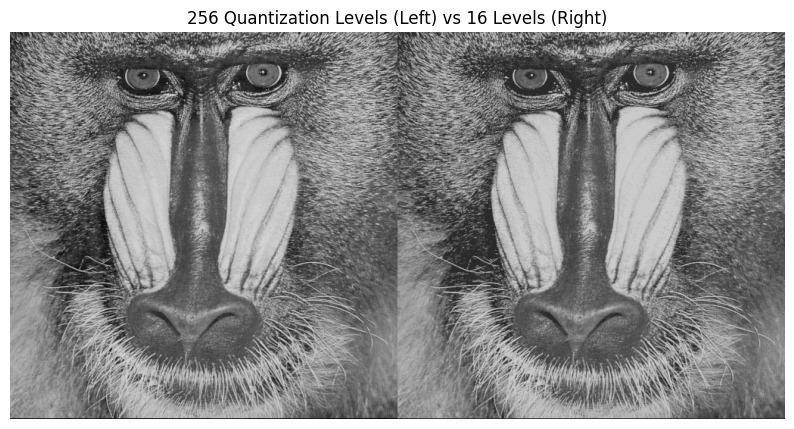

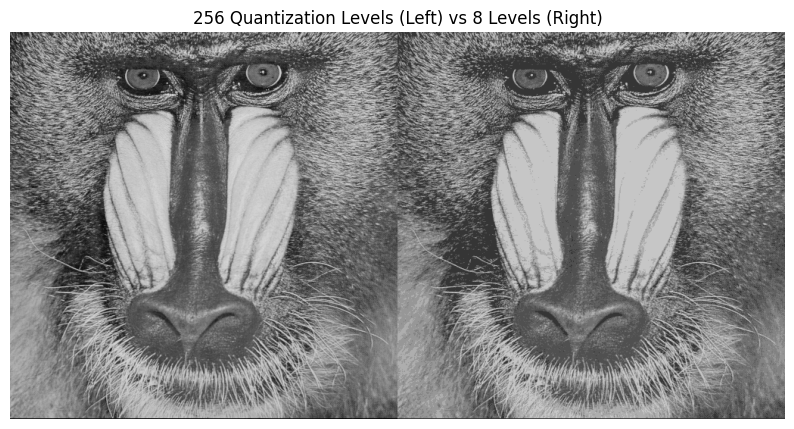

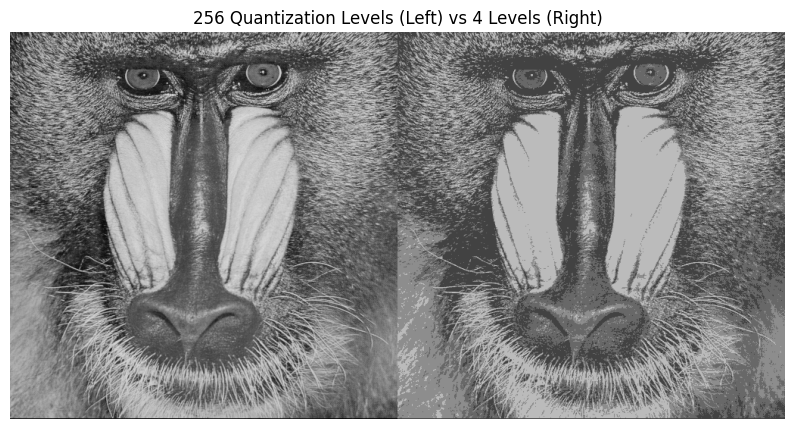

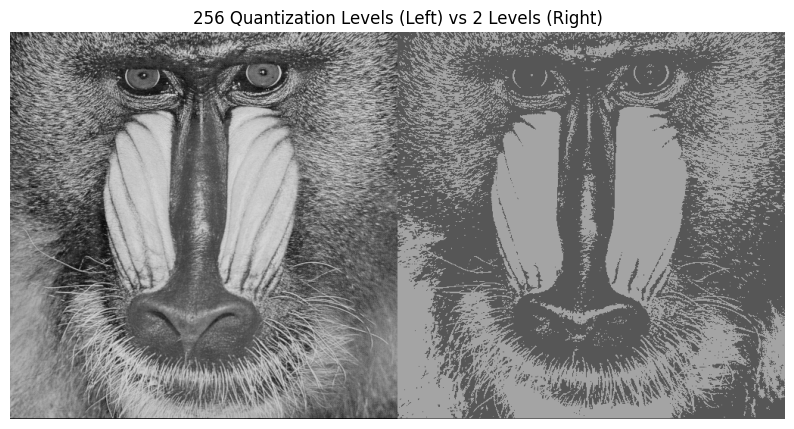

In [60]:
for n in range(4, 8):
    # Get quantized version
    quantized = image_gray.quantize(256 // 2**n)

    # Convert both to RGB before concatenating for display
    combined = get_concat_h(image_gray.convert('RGB'), quantized.convert('RGB'))

    # Display using matplotlib
    plt.figure(figsize=(10, 6))
    plt.imshow(combined)
    plt.title(f"256 Quantization Levels (Left) vs {256 // 2**n} Levels (Right)")
    plt.axis("off")
    plt.show()

**Color Channels**

working with different color channels

In [67]:
# Load and split the image
baboon = Image.open('../images/baboon.png')
red, green, blue = baboon.split()


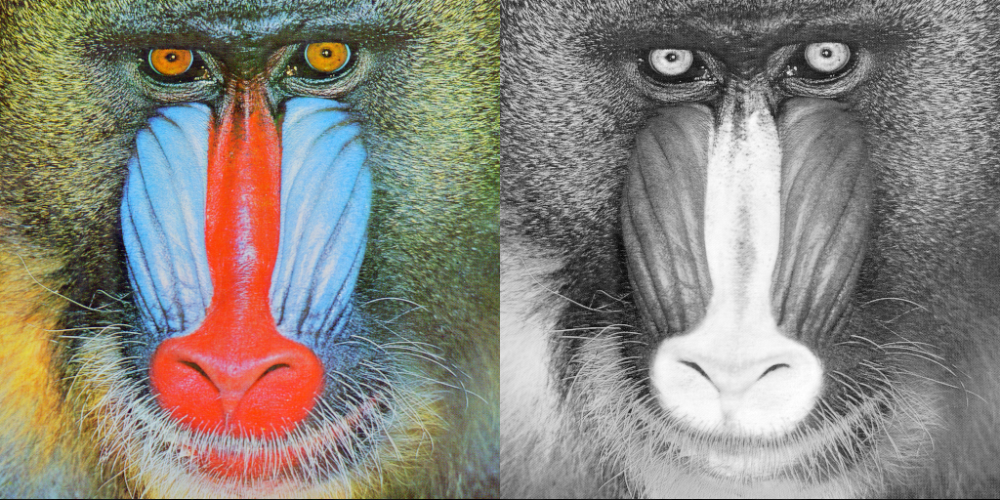

In [68]:
get_concat_h(baboon, red)

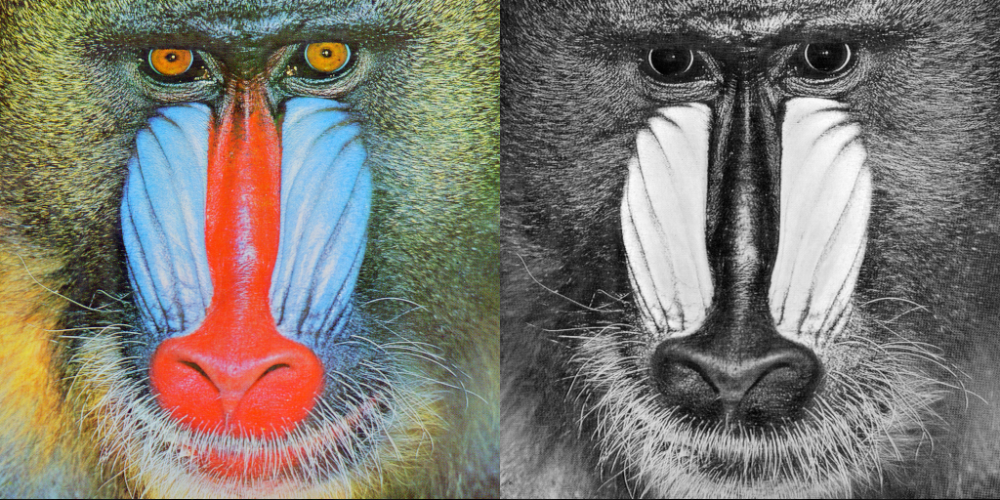

In [69]:
get_concat_h(baboon, blue)

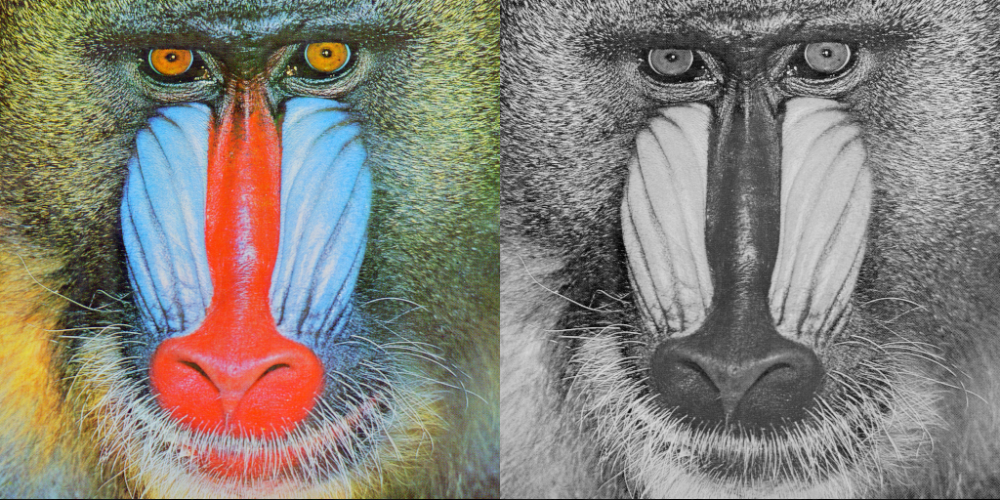

In [70]:
get_concat_h(baboon, green)

PIL Images into NumPy Arrays

In [ ]:
# Convert the image to an array
array= np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


In [77]:
array=np.array(image)

In [75]:
# summarize shape
print(array.shape)

(512, 512, 3)


In [76]:
# Print an image array
print(array)

[[[ 71 150 164]
  [ 31  57  63]
  [ 10  43  75]
  ...
  [ 68 119 117]
  [101 170 141]
  [118 188 179]]

 [[ 62 125 120]
  [ 33  97 135]
  [ 23  35  55]
  ...
  [ 98 140 122]
  [128 159 136]
  [ 74 138 120]]

 [[ 31  74  99]
  [ 46 118 132]
  [ 36  41  60]
  ...
  [ 90  93 118]
  [ 77  91  87]
  [ 49  80  96]]

 ...

 [[155 148 121]
  [150 156 123]
  [139 150 124]
  ...
  [ 60  73 110]
  [ 70  93  90]
  [ 60  80  81]]

 [[168 169 126]
  [151 151 117]
  [133 136 121]
  ...
  [ 68  84  73]
  [ 86  69  99]
  [ 71  63  80]]

 [[ 12  11   9]
  [ 11  12  10]
  [ 12  15  11]
  ...
  [  5   8   5]
  [  0   5   2]
  [  2   5   4]]]


In [ ]:
# Print the index(x,y) from the image array
array[0,0]

# he first element gives the number of rows or height of the image. 
# The second is element is the number of columns or width of the image. 
# The final element is the number of colour channels.

array([ 71, 150, 164], dtype=uint8)

In [ ]:
array.max()


np.uint8(255)

In [82]:
array.min()

np.uint8(0)

Indexing
plot array as image

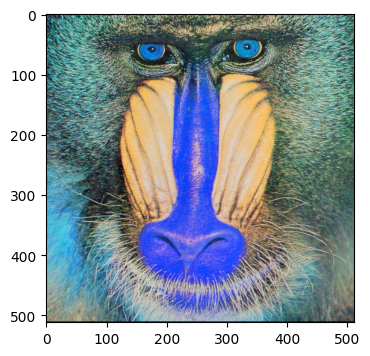

In [84]:
plt.figure(figsize=(4,4))
plt.imshow(array)
plt.show()

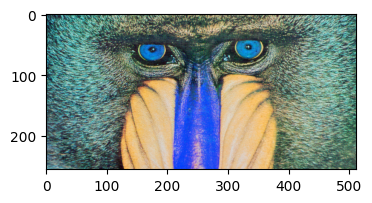

In [87]:
rows=256
plt.figure(figsize=(4,4))
plt.imshow(array[0:rows,:,:])
plt.show()


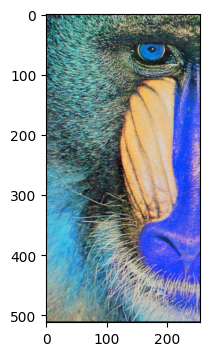

In [88]:
columns=256
plt.figure(figsize=(4,4))
plt.imshow(array[:,0:columns,:])
plt.show()


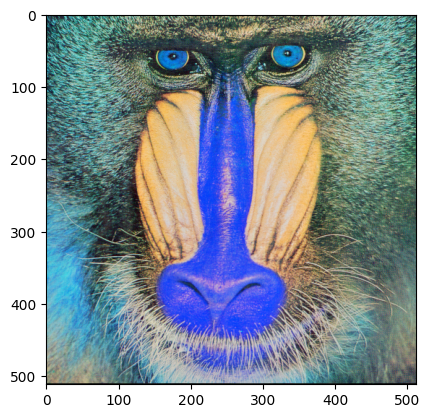

In [89]:
A = array.copy()
plt.imshow(A)
plt.show()

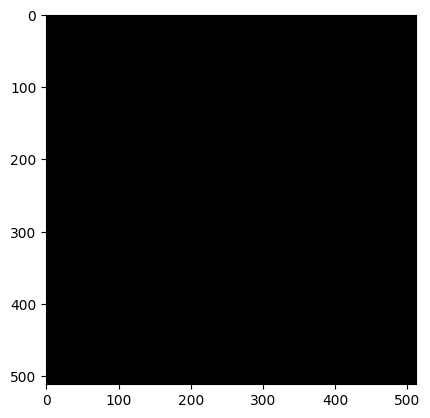

In [92]:
# If we donot apply the method copy(), thne variable will point to the same location in memory
B=A
A[:,:,:]=0
plt.imshow(B)
plt.show()

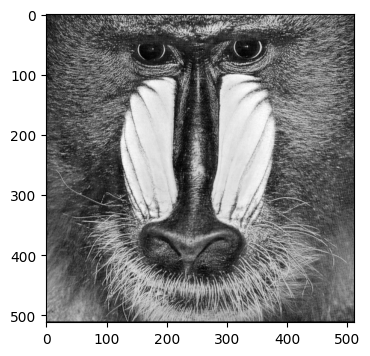

In [102]:
# Work with the different color channels
baboon_array=np.array(baboon)


# Plot the red channel 
plt.figure(figsize=(4,4))
plt.imshow(baboon_array[:,:,0],cmap='gray') # Red
plt.imshow(baboon_array[:,:,1],cmap='gray') # Green
plt.imshow(baboon_array[:,:,2],cmap='gray') # Blue
plt.show()

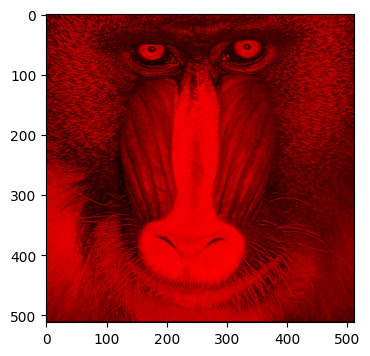

In [ ]:
# create a new array and set all but the red color channels to zero. 
# Therefore, when we display the image it appears red:
baboon_red=baboon_array.copy()
baboon_red[:,:,1]=0
baboon_red[:,:,2]=0
plt.figure(figsize=(4,4))
plt.imshow(baboon_red)
plt.show()

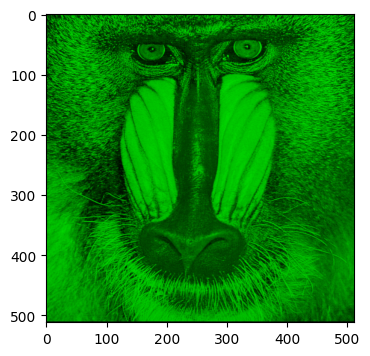

In [104]:
# create a new array and set all but the red color channels to zero. 
# Therefore, when we display the image it appears red:
baboon_green=baboon_array.copy()
baboon_green[:,:,0]=0
baboon_green[:,:,2]=0
plt.figure(figsize=(4,4))
plt.imshow(baboon_green)
plt.show()

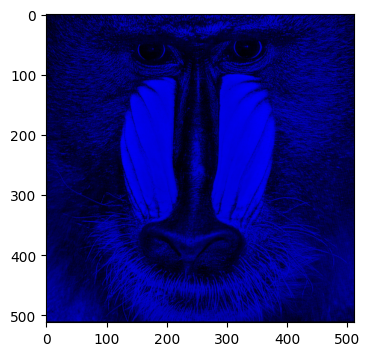

In [105]:
# create a new array and set all but the red color channels to zero. 
# Therefore, when we display the image it appears red:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,1]=0
baboon_blue[:,:,0]=0
plt.figure(figsize=(4,4))
plt.imshow(baboon_blue)
plt.show()

In [111]:
red_array=np.asarray(baboon_red)
red_array

array([[[164,   0,   0],
        [ 63,   0,   0],
        [ 75,   0,   0],
        ...,
        [117,   0,   0],
        [141,   0,   0],
        [179,   0,   0]],

       [[120,   0,   0],
        [135,   0,   0],
        [ 55,   0,   0],
        ...,
        [122,   0,   0],
        [136,   0,   0],
        [120,   0,   0]],

       [[ 99,   0,   0],
        [132,   0,   0],
        [ 60,   0,   0],
        ...,
        [118,   0,   0],
        [ 87,   0,   0],
        [ 96,   0,   0]],

       ...,

       [[121,   0,   0],
        [123,   0,   0],
        [124,   0,   0],
        ...,
        [110,   0,   0],
        [ 90,   0,   0],
        [ 81,   0,   0]],

       [[126,   0,   0],
        [117,   0,   0],
        [121,   0,   0],
        ...,
        [ 73,   0,   0],
        [ 99,   0,   0],
        [ 80,   0,   0]],

       [[  9,   0,   0],
        [ 10,   0,   0],
        [ 11,   0,   0],
        ...,
        [  5,   0,   0],
        [  2,   0,   0],
        [  4,   0,   0]]

Color Channel with OpenCV

In [13]:
my_image='lenna.jpg'

import os
import cv2
import matplotlib.pyplot as plt

In [3]:
cwd=os.getcwd()
cwd

'd:\\Student\\Projects\\Computer Vision and Image processing\\Image Processing'

In [4]:
image_path=os.path.join(cwd,my_image)
image_path

'd:\\Student\\Projects\\Computer Vision and Image processing\\Image Processing\\lenna.jpg'

In [9]:
lenna = cv2.imread('../images/lenna.jpg')
lenna

array([[[127, 135, 228],
        [126, 134, 227],
        [125, 133, 226],
        ...,
        [114, 149, 235],
        [ 92, 134, 217],
        [ 65, 109, 192]],

       [[127, 135, 228],
        [127, 135, 228],
        [126, 134, 227],
        ...,
        [120, 151, 236],
        [101, 137, 221],
        [ 73, 113, 195]],

       [[126, 137, 229],
        [125, 136, 228],
        [124, 135, 227],
        ...,
        [125, 149, 233],
        [105, 133, 217],
        [ 77, 107, 188]],

       ...,

       [[ 54,  19,  83],
        [ 57,  22,  86],
        [ 61,  25,  91],
        ...,
        [ 83,  70, 172],
        [ 82,  69, 177],
        [ 80,  70, 177]],

       [[ 53,  18,  82],
        [ 57,  22,  86],
        [ 62,  26,  92],
        ...,
        [ 84,  73, 177],
        [ 84,  73, 183],
        [ 84,  75, 185]],

       [[ 53,  18,  82],
        [ 57,  22,  86],
        [ 63,  27,  93],
        ...,
        [ 81,  69, 175],
        [ 82,  71, 181],
        [ 82,  73, 184]]

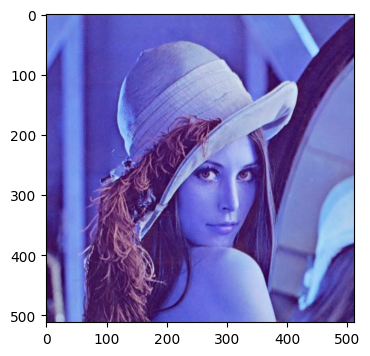

In [ ]:
# BGR mode in cv2
plt.figure(figsize=(4,4))
plt.imshow(lenna)
plt.show()

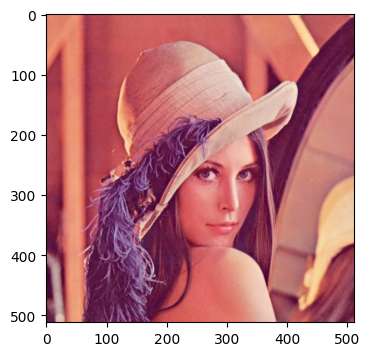

In [15]:
plt.figure(figsize=(4,4))
plt.imshow(cv2.cvtColor(lenna, cv2.COLOR_BGR2RGB))
plt.show()

In [16]:
blue, green, red= lenna[:,:,0],lenna[:,:,1],lenna[:,:,2]

In [ ]:
im_bgr=cv2.vconcat([blue, green, red])
im_bgr

array([[127, 126, 125, ..., 114,  92,  65],
       [127, 127, 126, ..., 120, 101,  73],
       [126, 125, 124, ..., 125, 105,  77],
       ...,
       [ 83,  86,  91, ..., 172, 177, 177],
       [ 82,  86,  92, ..., 177, 183, 185],
       [ 82,  86,  93, ..., 175, 181, 184]],
      shape=(1536, 512), dtype=uint8)

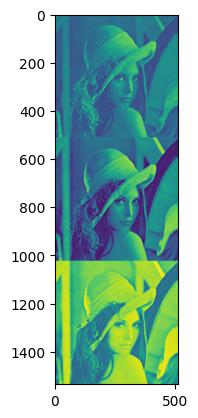

In [ ]:
# Red has the higher intensity
plt.imshow(im_bgr)
plt.show()

Q: Open any image and create a PIL Image object, convert the image into a numpy array we can manipulate called blue_array, get the blue channel out of it, and finally plot the image

In [112]:
from PIL import Image

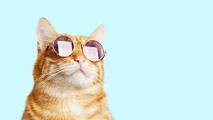

In [113]:
cat= Image.open('../images/cat.jpg')
cat

In [114]:
array_cat=np.asarray(cat)
array_cat

array([[[208, 249, 255],
        [208, 249, 255],
        [208, 249, 255],
        ...,
        [208, 249, 255],
        [208, 249, 255],
        [208, 249, 255]],

       [[208, 249, 255],
        [208, 249, 255],
        [208, 249, 255],
        ...,
        [208, 249, 255],
        [208, 249, 255],
        [208, 249, 255]],

       [[208, 249, 255],
        [208, 249, 255],
        [208, 249, 255],
        ...,
        [208, 249, 255],
        [208, 249, 255],
        [208, 249, 255]],

       ...,

       [[208, 249, 255],
        [208, 249, 255],
        [208, 249, 255],
        ...,
        [208, 249, 255],
        [208, 249, 255],
        [208, 249, 255]],

       [[208, 249, 255],
        [208, 249, 255],
        [208, 249, 255],
        ...,
        [208, 249, 255],
        [208, 249, 255],
        [208, 249, 255]],

       [[208, 249, 255],
        [208, 249, 255],
        [208, 249, 255],
        ...,
        [208, 249, 255],
        [208, 249, 255],
        [208, 249, 255]]

In [116]:
array_cat.min()
array_cat.max()

np.uint8(255)

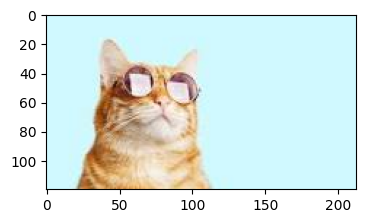

In [117]:
plt.figure(figsize=(4,4))
plt.imshow(array_cat)
plt.show()

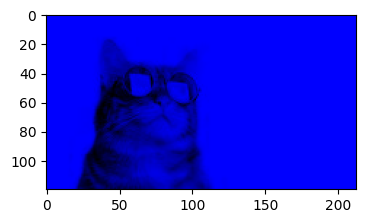

In [118]:
array_cat_blue=array_cat.copy()
array_cat_blue[:,:,0]=0
array_cat_blue[:,:,1]=0
plt.figure(figsize=(4,4))
plt.imshow(array_cat_blue)
plt.show()

In [119]:
red,green,blue=cat.split()

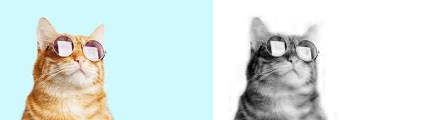

In [122]:
get_concat_h(cat, blue)